# Sesión 3 y 4 de SM: Introducción al análisis de audio con Python

---

# Tarea 3

# Configuración del Repositorio de GitHub, Conda y JupyterLab

## 0. Clonado del repositorio Github
- Se clona y se accede al repositorio de la tarea.

```bash
git clone https://github.com/MiguelMC-UNEX/Tarea3SM.git
```

```bash
cd Tarea3SM
```

## 1. Crear un entorno de Conda:

- Se creó el entorno `tarea3Miguel`.
```python
conda create --name tarea3Miguel
```  

## 2. Añadir la carpeta .ipynb_checkpoints/ al .gitignore:

- Se añade `.ipynb_checkpoints/` a `.gitignore`.

## 3. Activar el entorno Conda creado:

- En la terminal, se activa el entorno conda con:
```python
conda activate tarea3Miguel
```


## 4. Instalar Python 3.10, ipykernel y JupyterLab:

- Con el entorno activado, se ejecuta

```python
conda install python=3.10 ipykernel jupyterlab
```


```python
python3 -m ipykernel install --user --name=tarea3Miguel
```


## 5. Ejecutar JupyterLab y crear un notebook vacío:

- En la terminal (con el entorno activado), se ejecuta:

```bash
jupyter-lab
```



# Carga del audio (Desarrollo de la práctica)

<center><img src="img/mono_vs_stereo_diagram.jpg" alt="missing" width=500></center>

## Importar librerías y módulos de Python

<b>Nota</b>: Estas no son las únicas librerías de Python con las que se pueden trabajar para el procesamiento de archivos de audio (otro ejemplo podría ser <a href="https://librosa.org/doc/latest/index.html">Librosa</a>). Si alguien está familiarizado con otras librerías puede utilizarlas.

Importamos las librerías/módulos específicos de la siguiente forma, para pode trabajar con los ficheros de audio.

In [1]:
# Importacion.
# import librosa
from scipy.io import wavfile
import IPython
import os
import numpy as np

## Especificar directorios de entrada y salida

- Aquí definimos los directorios donde guardaremos los audios con los que vamos a trabajar, así como dónde se van a guardar aquellos que generamos a lo largo de la práctica.
- Lo haremos obteniendo el directorio actual y uniendo los path para obtener las ubicaciones de carga y salida de los ficheros de entrada y salida.

In [2]:
# Directorios que usaremos.
cwd = os.getcwd()
audio_input_path = os.path.join(cwd, os.path.join('audio', 'examples'))  # cambiar '_input' por 'examples'
audio_output_path = os.path.join(cwd, os.path.join('audio', '_output'))
print(f'Directorio con los audios de entrada: {audio_input_path}')
print(f'Directorio donde guardaremos los audios generados: {audio_output_path}\n')

Directorio con los audios de entrada: /home/miguel/Descargas/Tarea3SM/audio/examples
Directorio donde guardaremos los audios generados: /home/miguel/Descargas/Tarea3SM/audio/_output



## Cargar el archivo de audio estéreo

### Diferencias
Diferencias entre formatos de archivo para almacenar audio digital.

<ul>
    <li><b>.wav</b>: Archivo de audio sin comprimir (máxima calidad y gran tamaño de archivo). Típicamente utilizado en edición de audio debido a su fidelidad.</li>
    <li><b>.mp3</b> (por ejemplo): Archivo de audio comprimido (con pérdidas pero menor tamaño). Ampliamente usado.</li>
</ul>

### Carga del fichero
- Cargamos el archivo de audio the_last_of_us_reduced.wav en este caso.

In [3]:
# Cargamos el archivo de audio.
filename = os.path.join(audio_input_path, 'the_last_of_us_reduced.wav')
# audio_data, sample_rate = librosa.load(filename, sr=None, mono=False)
sample_rate, audio_data = wavfile.read(filename)
print(f'Frecuencia de muestreo (sample rate): {sample_rate/1000} kHz')

audio_datag = audio_data

Frecuencia de muestreo (sample rate): 44.1 kHz


Vamos a escucharlo. Para que esto se haga correctamente, hay que indicarle la frecuencia de muestreo (veremos más adelante qué es).

## Mostrar principales características de la onda del audio estéreo
### Explicación
Vamos a mostrar la información. Nota: es audio estereo (dos canales).

- con el `ls sh` mostramos el tamaño en MB
- Dividiendo la tasa de muestreo `sample_rate` entre 1000 obtenemos la frecuencia de muestreo.
- Accediendo a distintas posiciones de `audio_data` accedemos a los canales del audio.

In [4]:
# Mostrar informacion (sonido estéreo).
print('Datos de audio (estereo):')
!ls -sh audio/examples/the_last_of_us_reduced.wav
print(f'Frecuencia de muestreo (the_last_of_us_reduced.wav): {sample_rate/1000} kHz\n')
print(f'- 1º canal:   {audio_data[:5, 0]}...')
print(f'- 2º canal:   {audio_data[:5, 1]}...')
print(f'- Resolucion: {type(audio_data[0,0])}\n')


Datos de audio (estereo):
5,5M audio/examples/the_last_of_us_reduced.wav
Frecuencia de muestreo (the_last_of_us_reduced.wav): 44.1 kHz

- 1º canal:   [-2  0 -2 -1 -1]...
- 2º canal:   [ 0 -2  0 -1  0]...
- Resolucion: <class 'numpy.int16'>



## Incluisión del widget para reproducir el audio estéreo.
### Explicación
- Lo haremos con `IPython.display.Audio` para poder generar el `widget` y así poder escuchar el audio, incluyendo la opción `.T` para audio estéreo.

In [5]:
IPython.display.Audio(audio_data.T, rate=sample_rate) # .T se pasa únicamente si es audio estéreo.

## Conversión del audio estéreo a mono
Por simplificación, para hacerlo vamos a calcular la media por canal para obtener un sonido mono. Para ello hacemos la media por columnas con `audio_data.mean(axis=1)` o que es lo mismo la `media por canal`.

In [6]:
# Convertimos a mono mediante la media por canal (simplificacion).
new_data_mono = audio_data.mean(axis=1)  # Column-wise.
print('Nuevos datos de audio (mono):')
print(f'- Nuevo tamaño: {new_data_mono.shape}')
print(f'- Canal unico:  {new_data_mono[:5]}...')

# Mantenemos la misma resolucion que antes.
new_data_mono = new_data_mono.astype(np.int16)
print(f'- Resolucion:   {type(new_data_mono[0])}\n')

Nuevos datos de audio (mono):
- Nuevo tamaño: (1420427,)
- Canal unico:  [-1.  -1.  -1.  -1.  -0.5]...
- Resolucion:   <class 'numpy.int16'>



Vamos a guardarlo.

In [7]:
# Guardamos el archivo mono a un fichero de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, 'sample1_mono.wav'),
    rate=sample_rate,
    data=new_data_mono
)

## Incluisión del widget para reproducir el audio mono.
### Explicación
- Lo haremos con `IPython.display.Audio` para poder generar el `widget` y así poder escuchar el audio.

In [8]:
IPython.display.Audio(new_data_mono, rate=sample_rate)

# Explicación del código de las gráficas 


## Instalamos pillow y matplolib si no lo tenemos en nuestro entorno (como es el caso)

In [9]:
pip install pillow


Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


## Explicación del código y diferencia entre audio esteréo y mono.
### Diferencia entre audio esteréo y mono
- El `audio esteréo` tiene dos canales y es una onda sobre otra y tiene una doble fuente de sonido y más de un canal, mientras que el `audio mono` solo tiene un canal y es solo una onda.

### Explicación del código

- 1. Utilizamos `matplotlib`, para graficar el audio mono y estéreo, con un tamaño de gráfica de `10x4`.
- 2. En cuanto al `audio estéreo`, al ser dos canales tenemos que ajustar las dimensiones en función del tiempo / la tasa de muestreo.
- 3. Como se ha comentado el `audio estéreo` al tener dos canales, tendremos que graficar cada uno, como ya hemos definido una función tiempo, con ella sabiendo que el `Canal Izquierdo` está en la posición cero y `Canal Derecho` en la posición uno, podremos graficarlas y así obtendremos la gráfica del `audio estéreo`. 

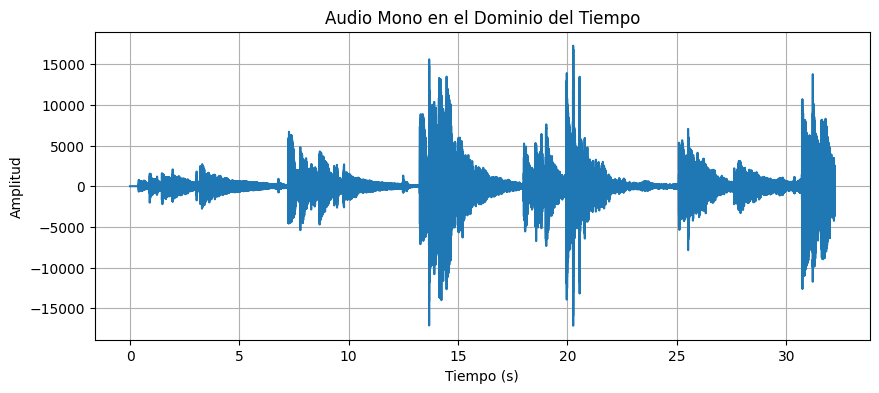

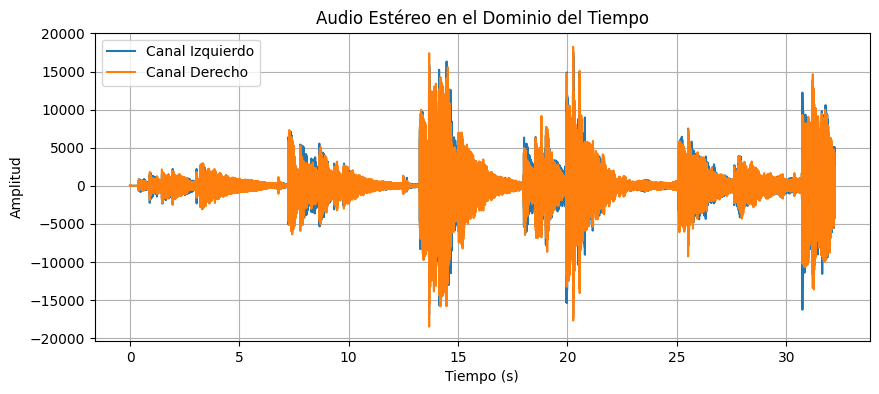

In [11]:
import matplotlib.pyplot as plt
import numpy as np


# Para el audio mono
plt.figure(figsize=(10, 4))
plt.plot(np.arange(len(new_data_mono)) / sample_rate, new_data_mono)
plt.title('Audio Mono en el Dominio del Tiempo')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid(True)
plt.show()

# Para el audio estéreo
if len(audio_data.shape) == 2 and audio_data.shape[1] == 2:  # Verifica si los datos son estéreo
    plt.figure(figsize=(10, 4))
    tiempo = np.arange(audio_data.shape[0]) / sample_rate  # Ajusta la dimensión de tiempo
    plt.plot(tiempo, audio_data[:, 0], label='Canal Izquierdo')
    plt.plot(tiempo, audio_data[:, 1], label='Canal Derecho')
    plt.title('Audio Estéreo en el Dominio del Tiempo')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Los datos no son estéreo o no tienen dos canales.")



# Tarea 4

---

# Explicaciones y/o Definciones

## Frecuencia de muestreo

*  Es el número de componentes de la señal o de muestras que tomamos por segundo y por tanto también es la velocidad en la que tomamos esas componentes.

## Aliasing

* Al recuperar una señal si no tomamos suficientes muestras de la señal original (es decir `la frecuencia de muestreo es insuficiente`), entonces no podremos recuperarla totalmente y nos puede salir deformada, esto se denomina `Aliasing` o `solapamiento`.

## Profundidad de bits

* Es la cantidad de bits disponibles que tenemos para muestrear una señal.

## Ancho de Banda

* Son las componentes de la señal que nos permite definir lo parecido que es a la señal original, cuanto mayor ancho de banda mayor reproducción exacta tendremos de la señal original.


## Tasa de bits

* Básicamente es el tamañano del archvo en Mbps, para su calculo se multiplica `la frecuencia de muestreo (el número de muestras)` x `la profundidad de bits (la cantidad de bits disponibles para muestrear en la señal)` y x `el numero de canales del archivo de audio`.






# ¿Por qué utilizamos la Transformación rápida de Fourier?
* Si queremos analizar una señal, en las dos componentes individualmente, y obtener sus componentes espectrales indivualmente, con esto podremos hacer una análisis espectral más detallado de la señal en el dominio de la frecuencia, ya que las componentes en frecuencias nos da más detalles de la señal, ya que el tiempo varía en amplitud, pero la frecuencia al ser la inversa del periodo, podemos ver como se concentran las componentes espectrales en el dominio de la frecuencia y ver donde se concentra más la señal.

## Explicación del código

1. Cogemos la longitud del audio mono `new_data_mono`

2. Utilizamos la función `fft.fft` para calcular la Transformada Rápida de Fourier (FFT) en audio mono.

3. Filtramos las frecuancias por debajo de Fs/2, esto para evitar el `aliasing`.

4. Gráficamos el espectro de frecuencias.

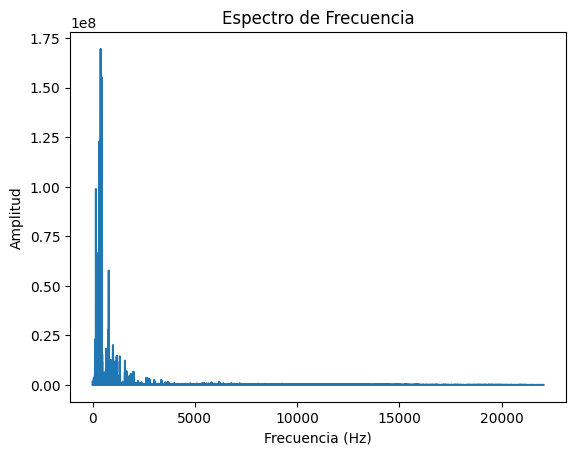

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Longitud del array de datos
n = len(new_data_mono)

# Frecuencia de muestreo (Fs)
Fs = sample_rate

# Calculando la Transformada Rápida de Fourier (FFT) en audio mono.
ch_Fourier = np.fft.fft(new_data_mono)

# Solo miramos frecuencias por debajo de Fs/2 (Nyquist-Shannon) para obtener el espectro.
abs_ch_Fourier = np.absolute(ch_Fourier[:n//2])

# Graficamos el espectro de frecuencias.
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Amplitud')
plt.xlabel('Frecuencia (Hz)')
plt.title('Espectro de Frecuencia')
plt.show()


# Calcular la energía del espectrograma y la frecuencia de corte eligiendo un epsilon (probad diferentes pero comentad solo uno).

## Explicación: 


*  Los valores de la frecuencia de corte con los diferentes valores de epislon sirve para que porcentaje de energía de la señal nos queremos quedar.

*  Con un `1e-5`, conservamos casi toda la energía de la señal exacatamente un 99,999%, queda un 0,001% restante que ignoramos y no conservaremos su energía.


* Con un `0,02`, conservamos el 98% de la energía de la señal.



* Con un `0,041`, conservamos un 95,8% de la energía de la señal.



* Con un `0,063`, conservamos un 93,7% de la energía de la señal.


* Con un `0,086`, conservamos un 91,4% de la energía de la señal, aquí empezamos ver que empieza a filtrar componentes más pequeñas.

* A paritr de `0,101`y sobre todo a partir de `0,123`, se puede realizar la observación de que estamos empezando a perder las primeras componentes, que dicho sea de paso son las que son más signficativas y es dónde se acumula el espectro en frecuencias.





Epsilon: 0.123
Valor de corte para la energia del espectro: 149557676784.52448
Mascara: [False False False ...  True  True  True]
Frecuencia de corte f0 (Hz): 3805


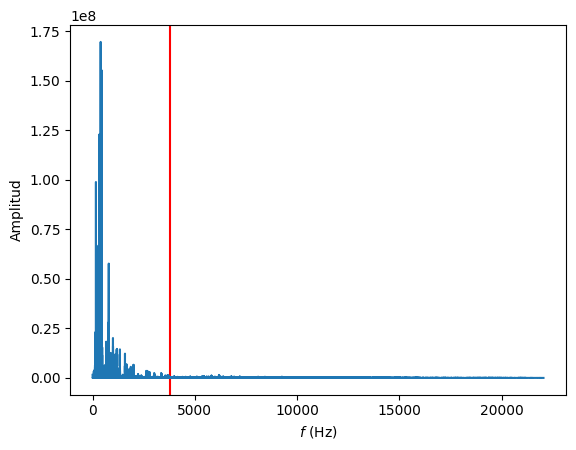

In [13]:
# Definimos diferentes epsilons: la parte de
# la energia del espectro que NO conservamos.
eps = [1e-5, .02, .041, .063, .086, .101, .123]

# Jugamos con los valores de epsilon (ID VARIANDO ESTE VALOR Y MIRAD LA GRÁFICA).
eps = eps[6]
print(f'Epsilon: {eps}')

# Calculamos el valor de corte para esta energia.
thr_spec_energy = (1 - eps) * np.sum(abs_ch_Fourier)
print(f'Valor de corte para la energia del espectro: {thr_spec_energy}')

# Integral de la frecuencia --> energia del espectro.
spec_energy = np.cumsum(abs_ch_Fourier)

# Mascara (array booleano) que compara el
# valor de corte con la energia del espectro.
frequencies_to_remove = thr_spec_energy < spec_energy  
print(f'Mascara: {frequencies_to_remove}')

# La frecuencia f0 por la que cortamos el espectro.
f0 = (len(frequencies_to_remove) - np.sum(frequencies_to_remove)) * (Fs/2) / (n//2)
print(f'Frecuencia de corte f0 (Hz): {int(f0)}')

# Graficamos.
plt.axvline(f0, color='r')
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Amplitud')
plt.xlabel('$f$ (Hz)')
plt.show()

# Comprimir la onda aplicando downsampling, donde el factor se obtiene a partir de la frecuencia de corte anteriormente calculada.

In [14]:
# Definimos los nombres de los audios comprimidos.
wav_compressed_file = "sample_48kHz_compressed.wav"

# Calculamos el factor D de downsampling.
D = int(Fs / f0)
print(f'Factor de downsampling: {D}')

# Obtenemos los nuevos datos (slicing with stride).
new_data = new_data_mono[::D]

# Escribimos los datos a un archivo de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, wav_compressed_file),
    rate=int(Fs/D),
    data=new_data
)

# Cargamos el nuevo archivo.
new_sample_rate, new_audio_data = wavfile.read(filename=os.path.join(audio_output_path, wav_compressed_file))

Factor de downsampling: 11


# Mostrar el espectograma de ambas ondas: original y comprimida. Explicar las diferencias.


## Explicación en un epsilon de 1e-5

### Diferencias:
Se pueden apreciar las siguientes diferencias entre ambos espectogramas:
1.  Se puede observar que el `espectograma del audio original`, abarca mayor espectro de frecuencias que la del `espectograma reducido/comprimido`.
2.  El espectro de frecuencias del `espectograma del audio original`, va de mínimo de `0 Hz` hasta por lo menos máximo `20000 Hz`.
3.  Mientras que el espectro de frecuencias del `espectograma reducido/comprimido` va de mínimo de `0 Hz` hasta por lo menos máximo `10000 Hz`.


### Conclusión:
* Al ver que el rango máximo del `espectograma del audio original`, tiene mayor resolución debido a que abarca mayor espectro de frecuencias que la del `espectograma reducido/comprimido` (`20000 hz máximo (original) vs 10000hz (reducido/comprimido))` . Si en la aplicación que debemos hacer importa más el muestreo en frecuencias pues el audio indicado sería el audio original ya que es el que tiene mayor resolución, en su espectograma en frecuencias. Por tanto nos quedaríamos con el `espectograma del audio original`.



## Explicación en un epsilon de 0,123

### Diferencias y conclusiones:
Se pueden apreciar las siguientes diferencias y conclusiones entre ambos espectogramas:
1.  Se puede observar que el `espectograma del audio original`, abarca mayor espectro de frecuencias que la del `espectograma reducido/comprimido`. Como en el `epsilon de 1e-5`.
2.  Pero hay una gran difrencia aquí y muy importante con un `epsilon de 0,123`, vamos a comprimir muchisismo el audio, debido a que estamos filtrando componentes en frecuencia muy significativas con este `epsilon`. Con lo cual nos quedará un espectograma bastante reducido en comparación al original, irá de `0hz hasta 2000hz`, por lo que obtendremos un audio bastante comprimido y muy `pegado`entre sí el audio en general.
   




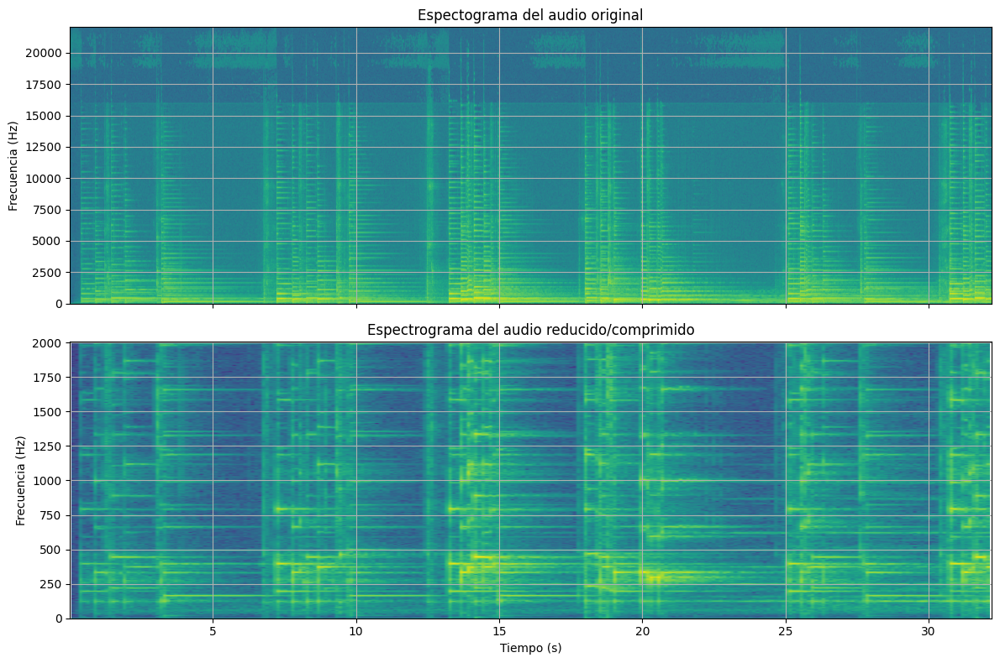

In [15]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

Pxx, freqs, bins, im = ax[0].specgram(new_data_mono, NFFT=1024, Fs=sample_rate, noverlap=512)
ax[0].set_title('Espectograma del audio original')
ax[0].set_ylabel('Frecuencia (Hz)')
ax[0].grid(True)

Pxx, freqs, bins, im = ax[1].specgram(new_audio_data, NFFT=1024, Fs=new_sample_rate, noverlap=512)
ax[1].set_title('Espectrograma del audio reducido/comprimido')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Frecuencia (Hz)')
ax[1].grid(True)

plt.tight_layout()
plt.show()

# Mostrar el tamaño de ambos archivos en Mb.

* El audio original es `sample1_mono.wav`.
* El audio comprimido `sample_48kHz_compressed.wav`.

In [16]:
!ls -sh audio/_output/sample1_mono.wav #El original

!ls -sh audio/_output/sample_48kHz_compressed.wav #El audio comprimido


2,8M audio/_output/sample1_mono.wav
256K audio/_output/sample_48kHz_compressed.wav


# Incluisión del widget para reproducir el audio mono.
## Explicación
- Lo haremos con `IPython.display.Audio` para poder generar el `widget` y así poder escuchar el audio.

In [17]:
IPython.display.Audio(new_data_mono, rate=sample_rate)

#  Incluisión del widget para reproducir el audio comprimido.
## Explicación
- Lo haremos con `IPython.display.Audio` para poder generar el `widget` y así poder escuchar el audio.

In [18]:
IPython.display.Audio(new_audio_data, rate=new_sample_rate)

# Diferencias de calidad que se aprecian entre los dos audios:

1. Los sonidos respecto del original `new_data_mono` y su comprimido `new_audio_data` son más agudos y van un poco más acelerados. Esto con el epsilon inicial.
2. Ahora bien si se utiliza, el epsilon de `0,123`, el audio sonará bastante comprimido, esto debido que esta empezando a filtrar componentes en frecuencias significativas como se explicó anteriormente.